# Pascal VOC challenge

### 필요 모듈 로드

In [1]:
import os
from IPython.display import clear_output
%pip install wandb==0.16.0 -q
%pip install --upgrade datasets -q
clear_output(wait=False)


In [2]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
import os
import albumentations as A
from tensorflow_examples.models.pix2pix import pix2pix
from tensorflow import keras
import math
import random
import pickle
from skimage.io import imread, imshow,show
from skimage.transform import resize
from glob import glob
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
import wandb
clear_output(wait=False)

In [3]:
from datasets import load_dataset
dataset = load_dataset("nateraw/pascal-voc-2012")

### CONSTANT

In [4]:
IMG_HEIGHT = 256
IMG_WIDTH  = 256

## 데이터 EDA

In [5]:
# 데이터셋의 기본 정보 출력
print("데이터셋 정보:")
print(dataset)



데이터셋 정보:
DatasetDict({
    train: Dataset({
        features: ['image', 'mask'],
        num_rows: 1464
    })
    val: Dataset({
        features: ['image', 'mask'],
        num_rows: 1449
    })
})


In [6]:
test_dataset=dataset["train"]

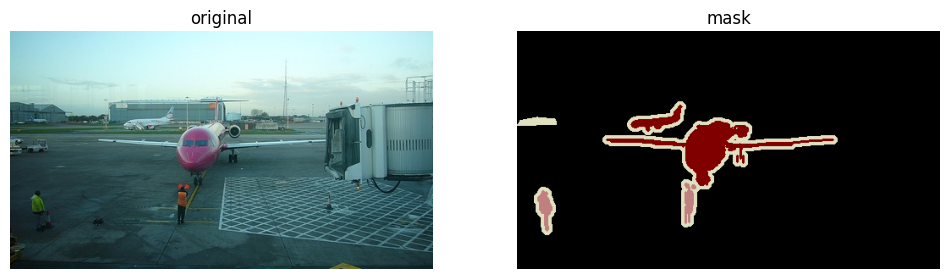

In [7]:
# 첫 번째 데이터 샘플을 로드
first_sample = test_dataset[0]
image = first_sample['image']
mask = first_sample['mask']

# 이미지와 마스크 표시
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# 원본 이미지
ax[0].imshow(image)
ax[0].set_title('original')
ax[0].axis('off')

# 마스크 이미지
ax[1].imshow(mask)
ax[1].set_title('mask')
ax[1].axis('off')

plt.show()


In [8]:
from PIL import Image
import numpy as np

# 이미지와 마스크를 NumPy 배열로 변환
input_images = np.array(test_dataset[0]['image'])
input_labels = np.array(test_dataset[0]['mask'])

# 변환된 배열의 형태 확인
print("Images shape:", input_images.shape)
print("Labels shape:", input_labels.shape)



Images shape: (281, 500, 3)
Labels shape: (281, 500, 3)


In [9]:
import numpy as np
from PIL import Image

def extract_class_color_mapping(masks):
    """
    마스크 이미지들에서 클래스별 색상 매핑을 추출하는 함수
    :param masks: 마스크 이미지의 리스트
    :return: 클래스와 색상의 매핑 딕셔너리
    """
    color_mapping = {}
    class_id = 0

    for mask in masks:
        # 마스크 이미지를 NumPy 배열로 변환
        mask_np = np.array(mask)
        # 고유한 색상 찾기
        unique_colors = np.unique(mask_np.reshape(-1, mask_np.shape[2]), axis=0)

        for color in unique_colors:
            # 색상을 튜플로 변환
            color_tuple = tuple(color)
            # 새로운 색상이면 클래스 ID 할당
            if color_tuple not in color_mapping:
                color_mapping[color_tuple] = class_id
                class_id += 1

    return color_mapping




def map_integer_mask_to_color(integer_mask, reverse_mapping):
    color_mask = np.zeros((integer_mask.shape[0], integer_mask.shape[1], 3), dtype=np.uint8)
    for row in range(integer_mask.shape[0]):
        for col in range(integer_mask.shape[1]):
            class_idx = integer_mask[row, col]
            color = reverse_mapping[class_idx]
            # 컬러 값을 [0, 255] 범위로 스케일링
            scaled_color = np.clip(color, 0, 255)
            color_mask[row, col] = scaled_color

    return color_mask
def create_inverse_mapping(class_color_mapping):
    """
    클래스 ID에서 색상으로의 역 매핑을 생성하는 함수
    :param class_color_mapping: 클래스와 색상의 매핑 딕셔너리
    :return: 역 매핑 딕셔너리
    """
    inverse_mapping = {class_id: color for color, class_id in class_color_mapping.items()}
    return inverse_mapping

In [10]:
# 데이터셋에서 마스크 목록 추출
masks = [sample['mask'] for sample in test_dataset]
pickle_file = 'class_color_mapping.pkl'
if not os.path.exists(pickle_file):
    # masks 변수는 이미 정의되어 있어야 합니다.
    class_color_mapping = extract_class_color_mapping(masks)

    # 추출한 매핑을 pickle 파일로 저장
    with open(pickle_file, 'wb') as file:
        pickle.dump(class_color_mapping, file)
else:
    # 파일이 이미 존재하는 경우, pickle 파일에서 데이터 불러오기
    with open(pickle_file, 'rb') as file:
        class_color_mapping = pickle.load(file)

In [11]:
pickle_file_inverse_mapping = 'inverse_mapping.pkl'
if not os.path.exists(pickle_file_inverse_mapping):

    inverse_mapping = create_inverse_mapping(class_color_mapping)
    # 추출한 매핑을 pickle 파일로 저장
    with open(pickle_file_inverse_mapping, 'wb') as file:
        pickle.dump(inverse_mapping, file)
else:
    # 파일이 이미 존재하는 경우, pickle 파일에서 데이터 불러오기
    with open(pickle_file_inverse_mapping, 'rb') as file:
        inverse_mapping = pickle.load(file)

In [12]:
print(class_color_mapping)
print(inverse_mapping)

{(0, 0, 0): 0, (128, 0, 0): 1, (192, 128, 128): 2, (224, 224, 192): 3, (0, 64, 128): 4, (64, 0, 128): 5, (192, 0, 0): 6, (128, 128, 0): 7, (128, 0, 128): 8, (0, 0, 128): 9, (192, 128, 0): 10, (128, 192, 0): 11, (64, 128, 128): 12, (192, 0, 128): 13, (64, 128, 0): 14, (0, 128, 0): 15, (128, 128, 128): 16, (64, 0, 0): 17, (0, 192, 0): 18, (0, 128, 128): 19, (0, 64, 0): 20, (128, 64, 0): 21}
{0: (0, 0, 0), 1: (128, 0, 0), 2: (192, 128, 128), 3: (224, 224, 192), 4: (0, 64, 128), 5: (64, 0, 128), 6: (192, 0, 0), 7: (128, 128, 0), 8: (128, 0, 128), 9: (0, 0, 128), 10: (192, 128, 0), 11: (128, 192, 0), 12: (64, 128, 128), 13: (192, 0, 128), 14: (64, 128, 0), 15: (0, 128, 0), 16: (128, 128, 128), 17: (64, 0, 0), 18: (0, 192, 0), 19: (0, 128, 128), 20: (0, 64, 0), 21: (128, 64, 0)}


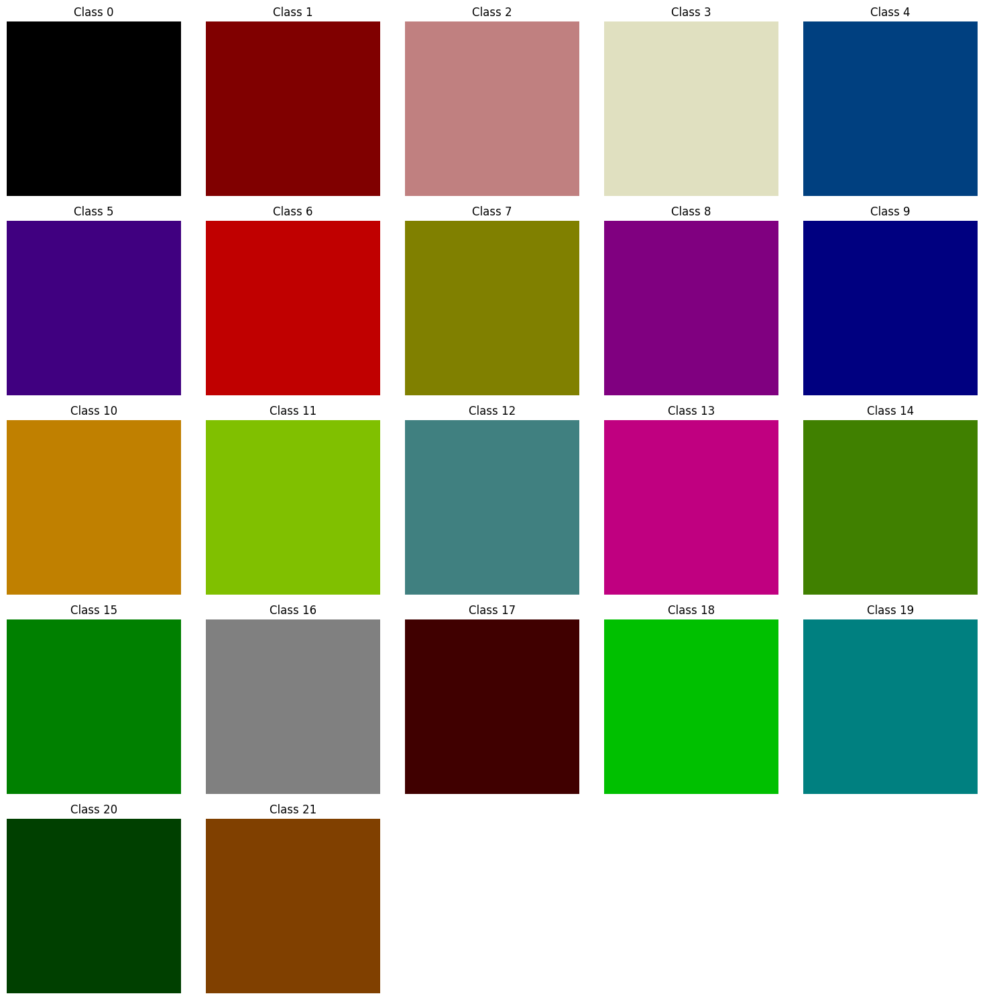

In [13]:
# 5행 5열의 서브플롯 생성
plt.figure(figsize=(15, 15))
for class_id, color in inverse_mapping.items():
    ax = plt.subplot(5, 5, class_id + 1)
    ax.set_title(f"Class {class_id}")
    ax.imshow(np.full((10, 10, 3), color, dtype=np.uint8))  # 색상으로 채운 작은 이미지 생성
    ax.axis('off')

# 나머지 빈 서브플롯 숨기기
for i in range(len(inverse_mapping) + 1, 26):
    ax = plt.subplot(5, 5, i)
    ax.axis('off')

plt.tight_layout()
plt.show()

## 데이터 전처리

In [14]:
from PIL import ImageOps
def map_colors_to_labels(seg, color_mapping):
    # 세그멘테이션 마스크의 높이와 너비를 얻습니다.
    height, width = seg.shape[:2]
    non_zero_indices = np.nonzero(seg)

    # 행과 열 인덱스를 튜플로 묶어 딕셔너리 생성
    index_dict = {}
        
    for i in range(len(non_zero_indices[0])):
        key = (non_zero_indices[0][i], non_zero_indices[1][i])
        index_dict[key] = 1             
    # 새로운 레이블 배열을 생성합니다.
    label_seg = np.zeros((height, width), dtype=np.int32)
    for i in index_dict.keys():
        
        y = i[0]
        x = i[1]
        
        # 현재 픽셀의 RGB 값을 가져옵니다.
        pixel = tuple(seg[y, x])

        # RGB 값에 해당하는 레이블을 찾아 할당합니다.
        label_seg[y, x] = color_mapping.get(pixel, 0)  # 기본값으로 0을 사용
            
    return label_seg
def data_concat(dataset):
    
    img_arr = []
    seg_arr = []

    img_arr_temp = dataset['train']['image'] + dataset['val']['image']

    seg_arr_temp = dataset['train']['mask'] + dataset['val']['mask']
    
    for img, seg in zip(img_arr_temp, seg_arr_temp):
        img = np.array(img.resize((IMG_WIDTH, IMG_HEIGHT),Image.NEAREST))
        seg = np.array(seg.resize((IMG_WIDTH, IMG_HEIGHT),Image.NEAREST))
        label_seg = map_colors_to_labels(seg, class_color_mapping)
        img_arr.append(img)
        seg_arr.append(label_seg)
    
    return np.array(img_arr), np.array(seg_arr)

In [15]:
full_dataset = tf.data.Dataset.from_tensor_slices(data_concat(dataset))
print(full_dataset)

2024-01-11 23:45:33.342884: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-11 23:45:33.350153: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-11 23:45:33.353894: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

<_TensorSliceDataset element_spec=(TensorSpec(shape=(256, 256, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(256, 256), dtype=tf.int32, name=None))>


In [16]:
DATASET_SIZE = 2913
train_size = int(0.7 * DATASET_SIZE)
val_size = int(0.2 * DATASET_SIZE)
test_size = int(0.1 * DATASET_SIZE)

full_dataset = full_dataset.shuffle(buffer_size = DATASET_SIZE)
train_dataset = full_dataset.take(train_size)
test_dataset = full_dataset.skip(train_size)
val_dataset = test_dataset.skip(test_size)
test_dataset = test_dataset.take(test_size)

In [17]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    return input_image, input_mask

def load_image_train(input_image, input_mask):
    input_mask = input_mask[ ..., np.newaxis]
    

    # random flip the image and mask
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)
    
    input_mask = input_mask[:, :, 0]
    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask
def load_image_test(input_image, input_mask):
    input_mask = input_mask[np.newaxis, ...]
    
    
    input_mask = input_mask[0]
    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask

In [18]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = train_size // BATCH_SIZE
train = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
val   = train_dataset.map(load_image_test, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test = test_dataset.map(load_image_test, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)
val_dataset = val.batch(BATCH_SIZE)

In [19]:
import matplotlib.font_manager as fm
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
# 그래프에서 마이너스 폰트 깨지는 문제에 대한 대처
# 그래프를 노트북 안에 그리기 위해 설정
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False
# ttf 폰트 전체갯수
print(len(font_list)) 
# fname 옵션을 사용하는 방법
path = 'MaruBuri-Light.ttf'
fontprop = fm.FontProperties(fname=path, size=18)

38


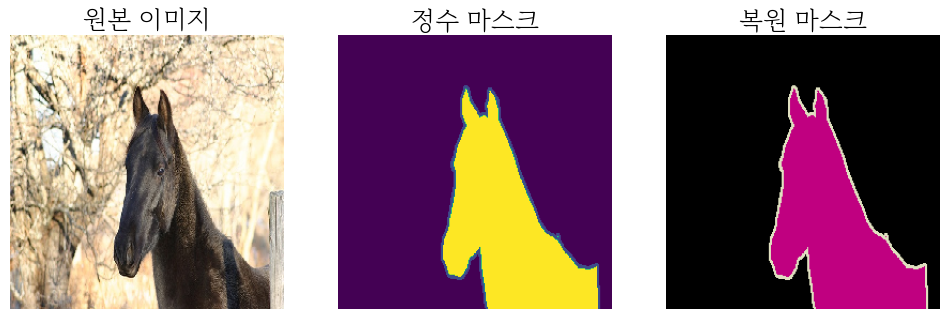

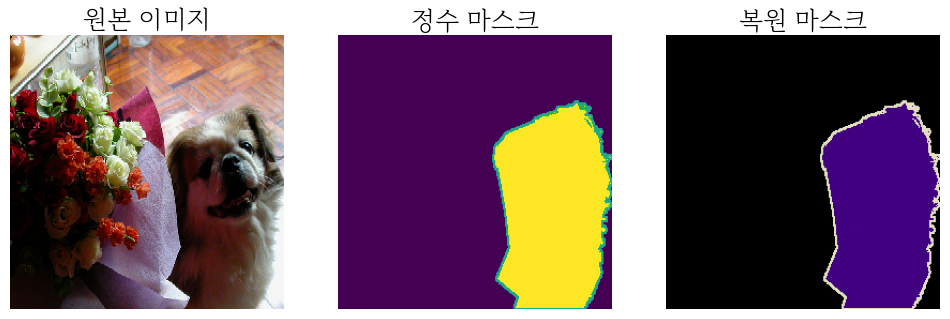

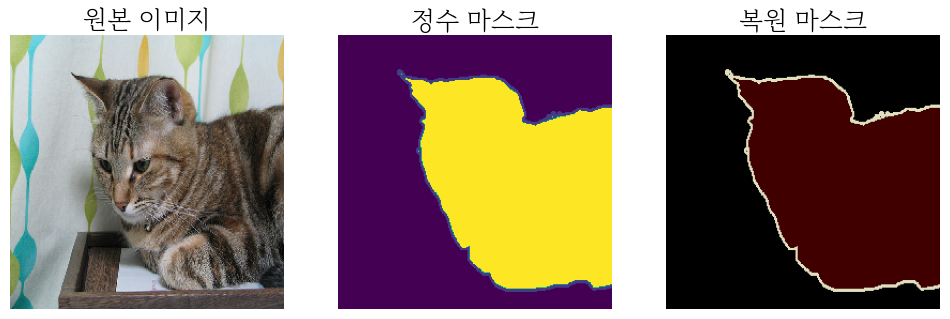

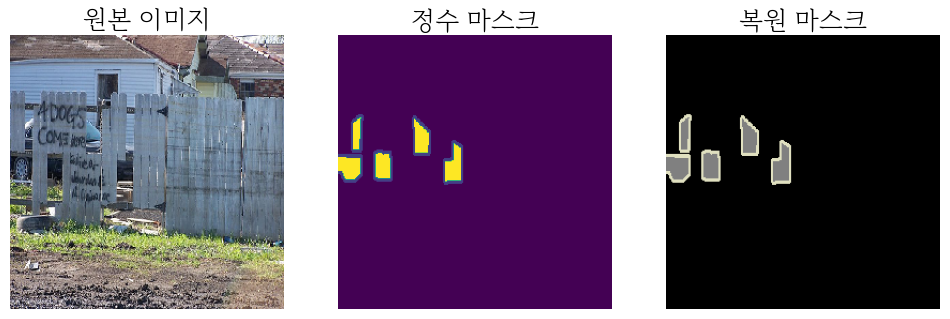

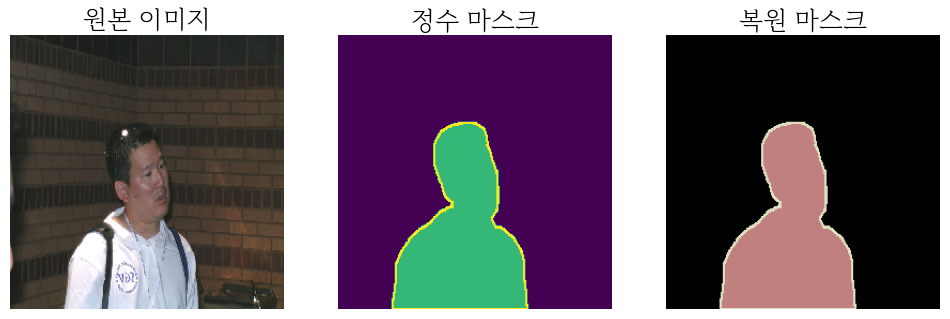

In [20]:
for image, mask in train.take(5):
    sample_image, sample_mask = image, mask
    restored_color_mask = map_integer_mask_to_color(np.array(sample_mask), inverse_mapping)
    fig, ax = plt.subplots(1, 3, figsize=(12, 6))
     # 원본 이미지
    clear_output()
    ax[0].imshow(sample_image)
    ax[0].set_title('원본 이미지' , fontproperties=fontprop)
    ax[0].axis('off')
    # 정수 마스크 이미지
    ax[1].imshow(sample_mask)
    ax[1].set_title('정수 마스크', fontproperties=fontprop)
    ax[1].axis('off')
    # 복원 마스크 이미지
    ax[2].imshow(restored_color_mask)
    ax[2].set_title('복원 마스크', fontproperties=fontprop)
    ax[2].axis('off')

## 모델 구성

In [21]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[IMG_HEIGHT, IMG_WIDTH, 3], include_top=False)

# use the output of listed layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# build the feature extraction model (encoder)
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)
# we'll not change the parameter of the decoder
down_stack.trainable = False
# build the upsampling model (decoder)
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

def unet_model(output_channels):
    inputs = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, 3])
    x = inputs

    # downsampling and extract features 
    skips = down_stack(x)
    x = skips[-1]
    # layers to establish skip connections in the encoder model
    skips = reversed(skips[:-1])

    # establish skip connections between layers of encoder and decoder
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

    # the last layer 
    last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 128x128

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)


## 훈련

In [22]:

sweep_config = {
    "name": "sweep_test_cv",
    "metric": {"name": "val_loss", "goal": "minimize"},
    "method": "random",
    "parameters": {
        "learning_rate" : {
            "min" : 0.0001,
            "max" : 0.01
            },
        "epoch" : {
            "distribution" : "int_uniform",
            "min" : 5,
            "max" : 10
            }
                    
        }
    }

In [23]:
EPOCHS = 50
VAL_SUBSPLITS = 5
VALIDATION_STEPS = val_size//BATCH_SIZE//VAL_SUBSPLITS
OUTPUT_CHANNELS = 22


In [24]:

wandb.login(key = '93419eb8a19caec1b5a855c81c59767847da9775')

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: dudnjsckrgo. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [25]:



def train():
    default_config = {
        "input" : (256,256,3),
        "learning_rate" : 1e-4,
        "optimizer" : "adam",
        "metrics" : ["accuracy"],
        "epoch" : 5,
        "batch_size" : 32
    }

    wandb.init(config = default_config)
    config = wandb.config


    # 머신 러닝 학습때 여러가지 optimzier를 사용할 경우나 learning rate를 조절할 경우에는 아래와 같은 형태의 코드를 응용합니다.

    if config.optimizer == 'adam':
        optimizer = keras.optimizers.Adam(learning_rate = config.learning_rate)
    
    model = unet_model(OUTPUT_CHANNELS)
    model.compile(optimizer=optimizer,
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=config.metrics)

    # WandbCallback 함수는 후술합니다.
    model.fit(train_dataset,
              epochs=config.epoch,
              steps_per_epoch=STEPS_PER_EPOCH,
              validation_steps=VALIDATION_STEPS,
              validation_data=val_dataset)
    
    test_loss, test_accuracy = model.evaluate(test_dataset, verbose=2)
    
    # wandb.log 함수 안에 기록하고 싶은 정보를 담습니다.
    
    wandb.log({"Test Accuracy Rate: " : round(test_accuracy * 100, 2),
               "Test Error Rate: " : round((1 - test_accuracy) * 100, 2)})

In [26]:
import os
os.environ["WANDB_NOTEBOOK_NAME"]="unet_backbone_mobile.ipynb"

In [27]:
# entity와 project에 본인의 아이디와 프로젝트명을 입력하세요

sweep_id = wandb.sweep(sweep_config,
                       entity = None,
                       project = 'DLThon')

# run the sweep
wandb.agent(sweep_id,
            function=train,
            count=10)

Create sweep with ID: smx8xpm0
Sweep URL: https://wandb.ai/dudnjsckrgo/DLThon/sweeps/smx8xpm0


wandb: Agent Starting Run: 2e97q8i6 with config:
wandb: 	epoch: 9
wandb: 	learning_rate: 0.005608845730214414


Epoch 1/9


2024-01-11 23:45:49.474264: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8906
2024-01-11 23:45:55.033400: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f0dc8707840 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-01-11 23:45:55.033413: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3060, Compute Capability 8.6
2024-01-11 23:45:55.036404: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1704984355.089418   64165 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


63/63 [==============================] - 22s 161ms/step - loss: 1.3894 - accuracy: 0.6895 - val_loss: 4.3210 - val_accuracy: 0.3431
Epoch 2/9
63/63 [==============================] - 15s 142ms/step - loss: 1.0803 - accuracy: 0.7199 - val_loss: 1.3787 - val_accuracy: 0.6141
Epoch 3/9
63/63 [==============================] - 9s 141ms/step - loss: 0.9591 - accuracy: 0.7377 - val_loss: 2.3276 - val_accuracy: 0.5174
Epoch 4/9
63/63 [==============================] - 9s 141ms/step - loss: 0.8449 - accuracy: 0.7587 - val_loss: 1.2388 - val_accuracy: 0.7330
Epoch 5/9
63/63 [==============================] - 9s 141ms/step - loss: 0.7757 - accuracy: 0.7744 - val_loss: 1.1423 - val_accuracy: 0.7498
Epoch 6/9
63/63 [==============================] - 9s 141ms/step - loss: 0.7170 - accuracy: 0.7873 - val_loss: 0.7784 - val_accuracy: 0.7851
Epoch 7/9
63/63 [==============================] - 9s 141ms/step - loss: 0.6995 - accuracy: 0.7921 - val_loss: 0.6601 - val_accuracy: 0.7985
Epoch 8/9
63/63 [====

Test Accuracy Rate:,▁
Test Error Rate:,▁
Test Accuracy Rate:,81.68
Test Error Rate:,18.32


wandb: Agent Starting Run: 1phux20c with config:
wandb: 	epoch: 10
wandb: 	learning_rate: 0.00901468579754049


Epoch 1/10
63/63 [==============================] - 13s 156ms/step - loss: 1.1006 - accuracy: 0.7490 - val_loss: 0.8426 - val_accuracy: 0.7903
Epoch 2/10
63/63 [==============================] - 9s 142ms/step - loss: 0.6490 - accuracy: 0.8072 - val_loss: 0.8434 - val_accuracy: 0.7832
Epoch 3/10
63/63 [==============================] - 9s 141ms/step - loss: 0.6286 - accuracy: 0.8145 - val_loss: 0.8233 - val_accuracy: 0.7658
Epoch 4/10
63/63 [==============================] - 9s 141ms/step - loss: 0.5971 - accuracy: 0.8233 - val_loss: 0.6986 - val_accuracy: 0.8082
Epoch 5/10
63/63 [==============================] - 9s 141ms/step - loss: 0.6193 - accuracy: 0.8196 - val_loss: 0.6054 - val_accuracy: 0.8323
Epoch 6/10
63/63 [==============================] - 9s 141ms/step - loss: 0.5595 - accuracy: 0.8307 - val_loss: 0.5341 - val_accuracy: 0.8436
Epoch 7/10
63/63 [==============================] - 9s 141ms/step - loss: 0.5330 - accuracy: 0.8379 - val_loss: 0.5253 - val_accuracy: 0.8478
Epoch

Test Accuracy Rate:,▁
Test Error Rate:,▁
Test Accuracy Rate:,81.14
Test Error Rate:,18.86


wandb: Agent Starting Run: cn1t6q8d with config:
wandb: 	epoch: 10
wandb: 	learning_rate: 0.005418828318158051


Epoch 1/10
63/63 [==============================] - 13s 154ms/step - loss: 0.9609 - accuracy: 0.7690 - val_loss: 0.5360 - val_accuracy: 0.8438
Epoch 2/10
63/63 [==============================] - 9s 142ms/step - loss: 0.4657 - accuracy: 0.8550 - val_loss: 0.4563 - val_accuracy: 0.8538
Epoch 3/10
63/63 [==============================] - 9s 141ms/step - loss: 0.4486 - accuracy: 0.8596 - val_loss: 0.5333 - val_accuracy: 0.8342
Epoch 4/10
63/63 [==============================] - 9s 142ms/step - loss: 0.4310 - accuracy: 0.8635 - val_loss: 0.4872 - val_accuracy: 0.8556
Epoch 5/10
63/63 [==============================] - 9s 141ms/step - loss: 0.4057 - accuracy: 0.8694 - val_loss: 0.5142 - val_accuracy: 0.8535
Epoch 6/10
63/63 [==============================] - 9s 141ms/step - loss: 0.3962 - accuracy: 0.8726 - val_loss: 0.4876 - val_accuracy: 0.8546
Epoch 7/10
63/63 [==============================] - 9s 141ms/step - loss: 0.3938 - accuracy: 0.8727 - val_loss: 0.4203 - val_accuracy: 0.8702
Epoch

Test Accuracy Rate:,▁
Test Error Rate:,▁
Test Accuracy Rate:,85.83
Test Error Rate:,14.17


wandb: Agent Starting Run: 4dvc1zk4 with config:
wandb: 	epoch: 8
wandb: 	learning_rate: 0.003539646788653834


Epoch 1/8
63/63 [==============================] - 13s 157ms/step - loss: 0.8230 - accuracy: 0.7932 - val_loss: 0.4952 - val_accuracy: 0.8488
Epoch 2/8
63/63 [==============================] - 9s 142ms/step - loss: 0.3637 - accuracy: 0.8848 - val_loss: 0.3990 - val_accuracy: 0.8776
Epoch 3/8
63/63 [==============================] - 9s 141ms/step - loss: 0.3279 - accuracy: 0.8924 - val_loss: 0.4565 - val_accuracy: 0.8647
Epoch 4/8
63/63 [==============================] - 9s 141ms/step - loss: 0.3088 - accuracy: 0.8972 - val_loss: 0.4529 - val_accuracy: 0.8785
Epoch 5/8
63/63 [==============================] - 9s 141ms/step - loss: 0.2971 - accuracy: 0.9007 - val_loss: 0.4574 - val_accuracy: 0.8719
Epoch 6/8
63/63 [==============================] - 9s 141ms/step - loss: 0.2895 - accuracy: 0.9024 - val_loss: 0.3723 - val_accuracy: 0.8830
Epoch 7/8
63/63 [==============================] - 9s 142ms/step - loss: 0.2818 - accuracy: 0.9045 - val_loss: 0.4374 - val_accuracy: 0.8783
Epoch 8/8
63

Test Accuracy Rate:,▁
Test Error Rate:,▁
Test Accuracy Rate:,87.42
Test Error Rate:,12.58


wandb: Agent Starting Run: s4q6e5wq with config:
wandb: 	epoch: 8
wandb: 	learning_rate: 0.0027972361300045174


Epoch 1/8
63/63 [==============================] - 13s 154ms/step - loss: 0.7743 - accuracy: 0.8042 - val_loss: 0.4471 - val_accuracy: 0.8767
Epoch 2/8
63/63 [==============================] - 9s 142ms/step - loss: 0.2913 - accuracy: 0.9065 - val_loss: 0.3600 - val_accuracy: 0.8881
Epoch 3/8
63/63 [==============================] - 9s 141ms/step - loss: 0.2605 - accuracy: 0.9137 - val_loss: 0.3987 - val_accuracy: 0.8855
Epoch 4/8
63/63 [==============================] - 9s 141ms/step - loss: 0.2434 - accuracy: 0.9178 - val_loss: 0.3682 - val_accuracy: 0.8909
Epoch 5/8
63/63 [==============================] - 9s 141ms/step - loss: 0.2354 - accuracy: 0.9199 - val_loss: 0.3417 - val_accuracy: 0.8931
Epoch 6/8
63/63 [==============================] - 9s 141ms/step - loss: 0.2224 - accuracy: 0.9232 - val_loss: 0.3418 - val_accuracy: 0.8975
Epoch 7/8
63/63 [==============================] - 9s 141ms/step - loss: 0.2157 - accuracy: 0.9255 - val_loss: 0.4485 - val_accuracy: 0.8766
Epoch 8/8
63

Test Accuracy Rate:,▁
Test Error Rate:,▁
Test Accuracy Rate:,89.43
Test Error Rate:,10.57


wandb: Agent Starting Run: 7rj3vf6d with config:
wandb: 	epoch: 8
wandb: 	learning_rate: 0.0038951148440318664


Epoch 1/8
63/63 [==============================] - 13s 154ms/step - loss: 0.6493 - accuracy: 0.8356 - val_loss: 0.4064 - val_accuracy: 0.8813
Epoch 2/8
63/63 [==============================] - 9s 142ms/step - loss: 0.2396 - accuracy: 0.9204 - val_loss: 0.4917 - val_accuracy: 0.8746
Epoch 3/8
63/63 [==============================] - 9s 142ms/step - loss: 0.2153 - accuracy: 0.9264 - val_loss: 0.3383 - val_accuracy: 0.8935
Epoch 4/8
63/63 [==============================] - 9s 142ms/step - loss: 0.2035 - accuracy: 0.9297 - val_loss: 0.3425 - val_accuracy: 0.8955
Epoch 5/8
63/63 [==============================] - 9s 141ms/step - loss: 0.1892 - accuracy: 0.9341 - val_loss: 0.4027 - val_accuracy: 0.8936
Epoch 6/8
63/63 [==============================] - 9s 142ms/step - loss: 0.1989 - accuracy: 0.9305 - val_loss: 0.3459 - val_accuracy: 0.9068
Epoch 7/8
63/63 [==============================] - 9s 142ms/step - loss: 0.1801 - accuracy: 0.9365 - val_loss: 0.4575 - val_accuracy: 0.8806
Epoch 8/8
63

Test Accuracy Rate:,▁
Test Error Rate:,▁
Test Accuracy Rate:,89.1
Test Error Rate:,10.9


wandb: Agent Starting Run: 14jbg35l with config:
wandb: 	epoch: 9
wandb: 	learning_rate: 0.007088647099798224


Epoch 1/9
63/63 [==============================] - 13s 154ms/step - loss: 0.6244 - accuracy: 0.8478 - val_loss: 0.4947 - val_accuracy: 0.8726
Epoch 2/9
63/63 [==============================] - 9s 142ms/step - loss: 0.2159 - accuracy: 0.9261 - val_loss: 0.4986 - val_accuracy: 0.8741
Epoch 3/9
63/63 [==============================] - 9s 142ms/step - loss: 0.2142 - accuracy: 0.9264 - val_loss: 0.4942 - val_accuracy: 0.8635
Epoch 4/9
63/63 [==============================] - 9s 142ms/step - loss: 0.2154 - accuracy: 0.9257 - val_loss: 0.5777 - val_accuracy: 0.8734
Epoch 5/9
63/63 [==============================] - 9s 142ms/step - loss: 0.1984 - accuracy: 0.9307 - val_loss: 0.5260 - val_accuracy: 0.8728
Epoch 6/9
63/63 [==============================] - 9s 142ms/step - loss: 0.1974 - accuracy: 0.9312 - val_loss: 0.4157 - val_accuracy: 0.8843
Epoch 7/9
63/63 [==============================] - 9s 142ms/step - loss: 0.1851 - accuracy: 0.9350 - val_loss: 0.4559 - val_accuracy: 0.8758
Epoch 8/9
63

Test Accuracy Rate:,▁
Test Error Rate:,▁
Test Accuracy Rate:,87.19
Test Error Rate:,12.81


wandb: Agent Starting Run: igbyxg0e with config:
wandb: 	epoch: 10
wandb: 	learning_rate: 0.002274483479144796


Epoch 1/10
63/63 [==============================] - 13s 158ms/step - loss: 0.7688 - accuracy: 0.8079 - val_loss: 0.4167 - val_accuracy: 0.8860
Epoch 2/10
63/63 [==============================] - 9s 142ms/step - loss: 0.1839 - accuracy: 0.9421 - val_loss: 0.3406 - val_accuracy: 0.8960
Epoch 3/10
63/63 [==============================] - 9s 142ms/step - loss: 0.1516 - accuracy: 0.9487 - val_loss: 0.3061 - val_accuracy: 0.9166
Epoch 4/10
63/63 [==============================] - 9s 142ms/step - loss: 0.1366 - accuracy: 0.9521 - val_loss: 0.5274 - val_accuracy: 0.8923
Epoch 5/10
63/63 [==============================] - 9s 142ms/step - loss: 0.1302 - accuracy: 0.9536 - val_loss: 0.4405 - val_accuracy: 0.8919
Epoch 6/10
63/63 [==============================] - 9s 142ms/step - loss: 0.1279 - accuracy: 0.9541 - val_loss: 0.3855 - val_accuracy: 0.8967
Epoch 7/10
63/63 [==============================] - 9s 142ms/step - loss: 0.1225 - accuracy: 0.9555 - val_loss: 0.3769 - val_accuracy: 0.9019
Epoch

Test Accuracy Rate:,▁
Test Error Rate:,▁
Test Accuracy Rate:,90.45
Test Error Rate:,9.55


wandb: Agent Starting Run: uugfs1p1 with config:
wandb: 	epoch: 5
wandb: 	learning_rate: 0.00133049270728138


Epoch 1/5
63/63 [==============================] - 13s 154ms/step - loss: 0.8136 - accuracy: 0.7947 - val_loss: 0.3867 - val_accuracy: 0.8933
Epoch 2/5
63/63 [==============================] - 9s 142ms/step - loss: 0.1865 - accuracy: 0.9469 - val_loss: 0.3939 - val_accuracy: 0.8920
Epoch 3/5
63/63 [==============================] - 9s 142ms/step - loss: 0.1406 - accuracy: 0.9553 - val_loss: 0.4725 - val_accuracy: 0.8900
Epoch 4/5
63/63 [==============================] - 9s 142ms/step - loss: 0.1254 - accuracy: 0.9576 - val_loss: 0.3823 - val_accuracy: 0.8998
Epoch 5/5
63/63 [==============================] - 9s 142ms/step - loss: 0.1159 - accuracy: 0.9597 - val_loss: 0.4786 - val_accuracy: 0.8872
10/10 - 1s - loss: 0.3505 - accuracy: 0.9065 - 702ms/epoch - 70ms/step


Test Accuracy Rate:,▁
Test Error Rate:,▁
Test Accuracy Rate:,90.65
Test Error Rate:,9.35


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: i3l3jh46 with config:
wandb: 	epoch: 6
wandb: 	learning_rate: 0.003589504592281265


Epoch 1/6
63/63 [==============================] - 13s 154ms/step - loss: 0.4865 - accuracy: 0.8764 - val_loss: 0.4753 - val_accuracy: 0.8841
Epoch 2/6
63/63 [==============================] - 9s 142ms/step - loss: 0.1285 - accuracy: 0.9552 - val_loss: 0.3459 - val_accuracy: 0.9117
Epoch 3/6
63/63 [==============================] - 9s 141ms/step - loss: 0.1175 - accuracy: 0.9576 - val_loss: 0.4422 - val_accuracy: 0.9026
Epoch 4/6
63/63 [==============================] - 9s 142ms/step - loss: 0.1126 - accuracy: 0.9588 - val_loss: 0.5699 - val_accuracy: 0.8747
Epoch 5/6
63/63 [==============================] - 9s 142ms/step - loss: 0.1107 - accuracy: 0.9592 - val_loss: 0.7190 - val_accuracy: 0.8809
Epoch 6/6
63/63 [==============================] - 9s 142ms/step - loss: 0.1112 - accuracy: 0.9589 - val_loss: 0.4410 - val_accuracy: 0.8891
10/10 - 1s - loss: 0.4903 - accuracy: 0.8918 - 703ms/epoch - 70ms/step


Test Accuracy Rate:,▁
Test Error Rate:,▁
Test Accuracy Rate:,89.18
Test Error Rate:,10.82


In [28]:
optimizer = keras.optimizers.Adam(learning_rate=1e-4)

In [29]:
model = unet_model(OUTPUT_CHANNELS)
model.compile(optimizer=optimizer,
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

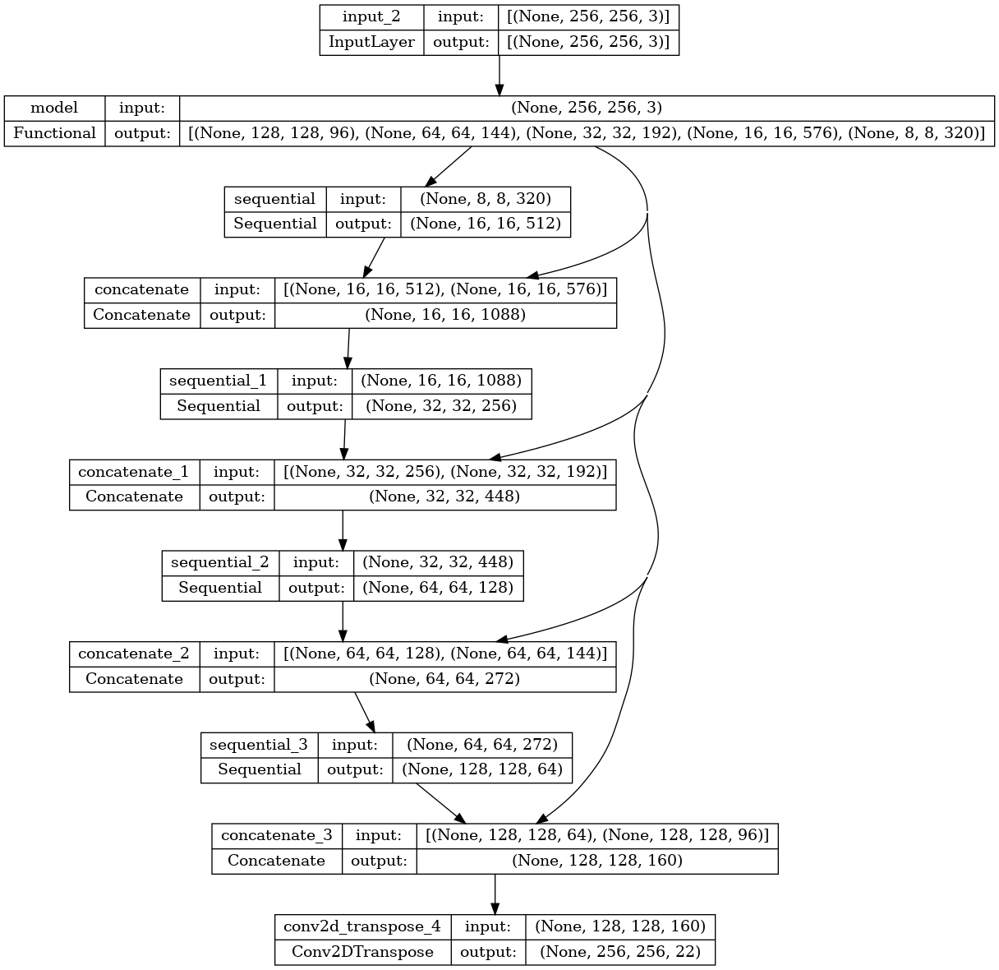

In [30]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:

MODEL_PATH = './UNET_mobile.keras'
callbacks = tf.keras.callbacks.ModelCheckpoint(
    filepath = MODEL_PATH,
    save_best_only = True,
    save_weights_only = False,
    monitor = 'val_accuracy',
    mode = 'max',
    verbose = 1
)

In [34]:
from wandb.keras import WandbMetricsLogger, WandbModelCheckpoint
model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,
                          callbacks = [callbacks,
                        WandbMetricsLogger(log_freq=5),
                        WandbModelCheckpoint("models")
        ])

Epoch 1/50


63/63 [==============================] - ETA: 0s - loss: 2.4079 - accuracy: 0.3905
Epoch 1: val_accuracy improved from -inf to 0.70421, saving model to ./UNET_mobile.keras


/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(


INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 33s 474ms/step - loss: 2.4079 - accuracy: 0.3905 - val_loss: 1.4451 - val_accuracy: 0.7042
Epoch 2/50
63/63 [==============================] - ETA: 0s - loss: 1.1909 - accuracy: 0.7153
Epoch 2: val_accuracy improved from 0.70421 to 0.70527, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 455ms/step - loss: 1.1909 - accuracy: 0.7153 - val_loss: 1.1591 - val_accuracy: 0.7053
Epoch 3/50
63/63 [==============================] - ETA: 0s - loss: 0.8647 - accuracy: 0.7617
Epoch 3: val_accuracy improved from 0.70527 to 0.79976, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 463ms/step - loss: 0.8647 - accuracy: 0.7617 - val_loss: 0.7712 - val_accuracy: 0.7998
Epoch 4/50
63/63 [==============================] - ETA: 0s - loss: 0.6653 - accuracy: 0.8141
Epoch 4: val_accuracy improved from 0.79976 to 0.80511, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 464ms/step - loss: 0.6653 - accuracy: 0.8141 - val_loss: 0.7192 - val_accuracy: 0.8051
Epoch 5/50
63/63 [==============================] - ETA: 0s - loss: 0.5249 - accuracy: 0.8582
Epoch 5: val_accuracy improved from 0.80511 to 0.81751, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 458ms/step - loss: 0.5249 - accuracy: 0.8582 - val_loss: 0.6705 - val_accuracy: 0.8175
Epoch 6/50
63/63 [==============================] - ETA: 0s - loss: 0.4344 - accuracy: 0.8866
Epoch 6: val_accuracy improved from 0.81751 to 0.86490, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 465ms/step - loss: 0.4344 - accuracy: 0.8866 - val_loss: 0.5048 - val_accuracy: 0.8649
Epoch 7/50
63/63 [==============================] - ETA: 0s - loss: 0.3743 - accuracy: 0.9039
Epoch 7: val_accuracy improved from 0.86490 to 0.87711, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 451ms/step - loss: 0.3743 - accuracy: 0.9039 - val_loss: 0.4609 - val_accuracy: 0.8771
Epoch 8/50
63/63 [==============================] - ETA: 0s - loss: 0.3214 - accuracy: 0.9178
Epoch 8: val_accuracy improved from 0.87711 to 0.87844, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 469ms/step - loss: 0.3214 - accuracy: 0.9178 - val_loss: 0.4546 - val_accuracy: 0.8784
Epoch 9/50
63/63 [==============================] - ETA: 0s - loss: 0.2819 - accuracy: 0.9279
Epoch 9: val_accuracy did not improve from 0.87844
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 448ms/step - loss: 0.2819 - accuracy: 0.9279 - val_loss: 0.4634 - val_accuracy: 0.8727
Epoch 10/50
63/63 [==============================] - ETA: 0s - loss: 0.2526 - accuracy: 0.9354
Epoch 10: val_accuracy improved from 0.87844 to 0.88434, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 467ms/step - loss: 0.2526 - accuracy: 0.9354 - val_loss: 0.4287 - val_accuracy: 0.8843
Epoch 11/50
63/63 [==============================] - ETA: 0s - loss: 0.2306 - accuracy: 0.9412
Epoch 11: val_accuracy improved from 0.88434 to 0.89013, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 467ms/step - loss: 0.2306 - accuracy: 0.9412 - val_loss: 0.4297 - val_accuracy: 0.8901
Epoch 12/50
63/63 [==============================] - ETA: 0s - loss: 0.2165 - accuracy: 0.9439
Epoch 12: val_accuracy did not improve from 0.89013
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 447ms/step - loss: 0.2165 - accuracy: 0.9439 - val_loss: 0.4210 - val_accuracy: 0.8898
Epoch 13/50
63/63 [==============================] - ETA: 0s - loss: 0.1991 - accuracy: 0.9484
Epoch 13: val_accuracy did not improve from 0.89013
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 450ms/step - loss: 0.1991 - accuracy: 0.9484 - val_loss: 0.4554 - val_accuracy: 0.8815
Epoch 14/50
63/63 [==============================] - ETA: 0s - loss: 0.1856 - accuracy: 0.9511
Epoch 14: val_accuracy improved from 0.89013 to 0.91405, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 464ms/step - loss: 0.1856 - accuracy: 0.9511 - val_loss: 0.3161 - val_accuracy: 0.9140
Epoch 15/50
63/63 [==============================] - ETA: 0s - loss: 0.1787 - accuracy: 0.9520
Epoch 15: val_accuracy improved from 0.91405 to 0.91826, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 465ms/step - loss: 0.1787 - accuracy: 0.9520 - val_loss: 0.2953 - val_accuracy: 0.9183
Epoch 16/50
63/63 [==============================] - ETA: 0s - loss: 0.1688 - accuracy: 0.9539
Epoch 16: val_accuracy did not improve from 0.91826
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 449ms/step - loss: 0.1688 - accuracy: 0.9539 - val_loss: 0.4036 - val_accuracy: 0.8918
Epoch 17/50
63/63 [==============================] - ETA: 0s - loss: 0.1578 - accuracy: 0.9564
Epoch 17: val_accuracy did not improve from 0.91826
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 451ms/step - loss: 0.1578 - accuracy: 0.9564 - val_loss: 0.3475 - val_accuracy: 0.9034
Epoch 18/50
63/63 [==============================] - ETA: 0s - loss: 0.1539 - accuracy: 0.9566
Epoch 18: val_accuracy did not improve from 0.91826
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 450ms/step - loss: 0.1539 - accuracy: 0.9566 - val_loss: 0.3574 - val_accuracy: 0.9015
Epoch 19/50
63/63 [==============================] - ETA: 0s - loss: 0.1525 - accuracy: 0.9565
Epoch 19: val_accuracy did not improve from 0.91826
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 450ms/step - loss: 0.1525 - accuracy: 0.9565 - val_loss: 0.3548 - val_accuracy: 0.9024
Epoch 20/50
63/63 [==============================] - ETA: 0s - loss: 0.1447 - accuracy: 0.9580
Epoch 20: val_accuracy did not improve from 0.91826
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 455ms/step - loss: 0.1447 - accuracy: 0.9580 - val_loss: 0.3913 - val_accuracy: 0.8944
Epoch 21/50
63/63 [==============================] - ETA: 0s - loss: 0.1405 - accuracy: 0.9588
Epoch 21: val_accuracy did not improve from 0.91826
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 455ms/step - loss: 0.1405 - accuracy: 0.9588 - val_loss: 0.3443 - val_accuracy: 0.9111
Epoch 22/50
63/63 [==============================] - ETA: 0s - loss: 0.1353 - accuracy: 0.9596
Epoch 22: val_accuracy did not improve from 0.91826
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 450ms/step - loss: 0.1353 - accuracy: 0.9596 - val_loss: 0.4442 - val_accuracy: 0.8876
Epoch 23/50
63/63 [==============================] - ETA: 0s - loss: 0.1327 - accuracy: 0.9598
Epoch 23: val_accuracy did not improve from 0.91826
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 460ms/step - loss: 0.1327 - accuracy: 0.9598 - val_loss: 0.3368 - val_accuracy: 0.9045
Epoch 24/50
63/63 [==============================] - ETA: 0s - loss: 0.1288 - accuracy: 0.9607
Epoch 24: val_accuracy improved from 0.91826 to 0.92275, saving model to ./UNET_mobile.keras
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 459ms/step - loss: 0.1288 - accuracy: 0.9607 - val_loss: 0.2644 - val_accuracy: 0.9228
Epoch 25/50
63/63 [==============================] - ETA: 0s - loss: 0.1245 - accuracy: 0.9615
Epoch 25: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 454ms/step - loss: 0.1245 - accuracy: 0.9615 - val_loss: 0.3021 - val_accuracy: 0.9169
Epoch 26/50
63/63 [==============================] - ETA: 0s - loss: 0.1258 - accuracy: 0.9606
Epoch 26: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 447ms/step - loss: 0.1258 - accuracy: 0.9606 - val_loss: 0.3007 - val_accuracy: 0.9150
Epoch 27/50
63/63 [==============================] - ETA: 0s - loss: 0.1222 - accuracy: 0.9616
Epoch 27: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 461ms/step - loss: 0.1222 - accuracy: 0.9616 - val_loss: 0.2884 - val_accuracy: 0.9209
Epoch 28/50
63/63 [==============================] - ETA: 0s - loss: 0.1192 - accuracy: 0.9621
Epoch 28: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 450ms/step - loss: 0.1192 - accuracy: 0.9621 - val_loss: 0.3426 - val_accuracy: 0.9033
Epoch 29/50
63/63 [==============================] - ETA: 0s - loss: 0.1174 - accuracy: 0.9623
Epoch 29: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 454ms/step - loss: 0.1174 - accuracy: 0.9623 - val_loss: 0.4838 - val_accuracy: 0.8853
Epoch 30/50
63/63 [==============================] - ETA: 0s - loss: 0.1151 - accuracy: 0.9628
Epoch 30: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 444ms/step - loss: 0.1151 - accuracy: 0.9628 - val_loss: 0.4269 - val_accuracy: 0.8956
Epoch 31/50
63/63 [==============================] - ETA: 0s - loss: 0.1140 - accuracy: 0.9628
Epoch 31: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 459ms/step - loss: 0.1140 - accuracy: 0.9628 - val_loss: 0.2757 - val_accuracy: 0.9220
Epoch 32/50
63/63 [==============================] - ETA: 0s - loss: 0.1113 - accuracy: 0.9634
Epoch 32: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 445ms/step - loss: 0.1113 - accuracy: 0.9634 - val_loss: 0.4257 - val_accuracy: 0.8972
Epoch 33/50
63/63 [==============================] - ETA: 0s - loss: 0.1104 - accuracy: 0.9637
Epoch 33: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 464ms/step - loss: 0.1104 - accuracy: 0.9637 - val_loss: 0.3428 - val_accuracy: 0.9066
Epoch 34/50
63/63 [==============================] - ETA: 0s - loss: 0.1114 - accuracy: 0.9629
Epoch 34: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 449ms/step - loss: 0.1114 - accuracy: 0.9629 - val_loss: 0.4257 - val_accuracy: 0.8929
Epoch 35/50
63/63 [==============================] - ETA: 0s - loss: 0.1074 - accuracy: 0.9640
Epoch 35: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 455ms/step - loss: 0.1074 - accuracy: 0.9640 - val_loss: 0.4626 - val_accuracy: 0.8856
Epoch 36/50
63/63 [==============================] - ETA: 0s - loss: 0.1084 - accuracy: 0.9636
Epoch 36: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 456ms/step - loss: 0.1084 - accuracy: 0.9636 - val_loss: 0.4356 - val_accuracy: 0.8934
Epoch 37/50
63/63 [==============================] - ETA: 0s - loss: 0.1044 - accuracy: 0.9646
Epoch 37: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 462ms/step - loss: 0.1044 - accuracy: 0.9646 - val_loss: 0.4810 - val_accuracy: 0.8872
Epoch 38/50
63/63 [==============================] - ETA: 0s - loss: 0.1070 - accuracy: 0.9636
Epoch 38: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 448ms/step - loss: 0.1070 - accuracy: 0.9636 - val_loss: 0.3368 - val_accuracy: 0.9085
Epoch 39/50
63/63 [==============================] - ETA: 0s - loss: 0.1032 - accuracy: 0.9647
Epoch 39: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 451ms/step - loss: 0.1032 - accuracy: 0.9647 - val_loss: 0.3701 - val_accuracy: 0.9030
Epoch 40/50
63/63 [==============================] - ETA: 0s - loss: 0.1036 - accuracy: 0.9645
Epoch 40: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 453ms/step - loss: 0.1036 - accuracy: 0.9645 - val_loss: 0.3940 - val_accuracy: 0.9010
Epoch 41/50
63/63 [==============================] - ETA: 0s - loss: 0.1010 - accuracy: 0.9652
Epoch 41: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 458ms/step - loss: 0.1010 - accuracy: 0.9652 - val_loss: 0.3765 - val_accuracy: 0.8977
Epoch 42/50
63/63 [==============================] - ETA: 0s - loss: 0.1021 - accuracy: 0.9647
Epoch 42: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 446ms/step - loss: 0.1021 - accuracy: 0.9647 - val_loss: 0.3340 - val_accuracy: 0.9087
Epoch 43/50
63/63 [==============================] - ETA: 0s - loss: 0.1006 - accuracy: 0.9649
Epoch 43: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 454ms/step - loss: 0.1006 - accuracy: 0.9649 - val_loss: 0.4376 - val_accuracy: 0.9003
Epoch 44/50
63/63 [==============================] - ETA: 0s - loss: 0.1000 - accuracy: 0.9652
Epoch 44: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 456ms/step - loss: 0.1000 - accuracy: 0.9652 - val_loss: 0.3379 - val_accuracy: 0.9133
Epoch 45/50
63/63 [==============================] - ETA: 0s - loss: 0.0994 - accuracy: 0.9652
Epoch 45: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 445ms/step - loss: 0.0994 - accuracy: 0.9652 - val_loss: 0.4636 - val_accuracy: 0.8950
Epoch 46/50
63/63 [==============================] - ETA: 0s - loss: 0.0972 - accuracy: 0.9659
Epoch 46: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 459ms/step - loss: 0.0972 - accuracy: 0.9659 - val_loss: 0.3707 - val_accuracy: 0.9063
Epoch 47/50
63/63 [==============================] - ETA: 0s - loss: 0.0980 - accuracy: 0.9655
Epoch 47: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 445ms/step - loss: 0.0980 - accuracy: 0.9655 - val_loss: 0.3873 - val_accuracy: 0.9017
Epoch 48/50
63/63 [==============================] - ETA: 0s - loss: 0.0967 - accuracy: 0.9658
Epoch 48: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 29s 460ms/step - loss: 0.0967 - accuracy: 0.9658 - val_loss: 0.3983 - val_accuracy: 0.9027
Epoch 49/50
63/63 [==============================] - ETA: 0s - loss: 0.0967 - accuracy: 0.9657
Epoch 49: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 449ms/step - loss: 0.0967 - accuracy: 0.9657 - val_loss: 0.5307 - val_accuracy: 0.8843
Epoch 50/50
63/63 [==============================] - ETA: 0s - loss: 0.0948 - accuracy: 0.9663
Epoch 50: val_accuracy did not improve from 0.92275
INFO:tensorflow:Assets written to: models/assets


INFO:tensorflow:Assets written to: models/assets
/usr/local/lib/python3.11/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(
wandb: Adding directory to artifact (./models)... Done. 0.2s


63/63 [==============================] - 28s 454ms/step - loss: 0.0948 - accuracy: 0.9663 - val_loss: 0.5036 - val_accuracy: 0.8914


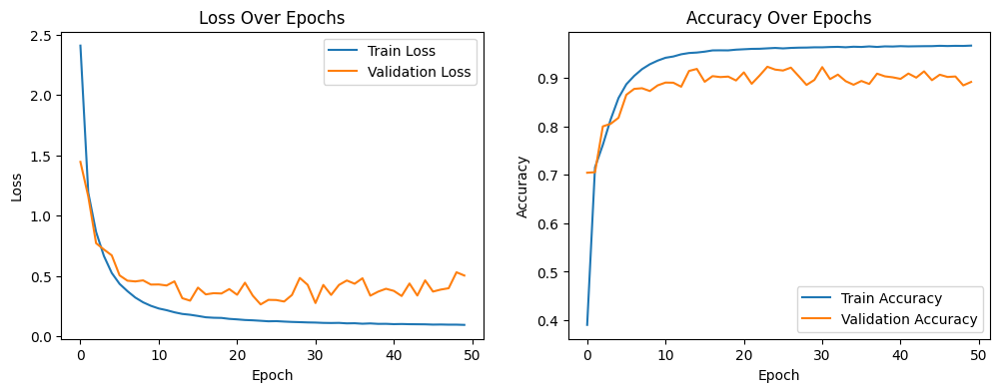

In [36]:
from aiffel7.history_graph import plot_history
plot_history(model_history)

1/1 [==============================] - 1s 758ms/step


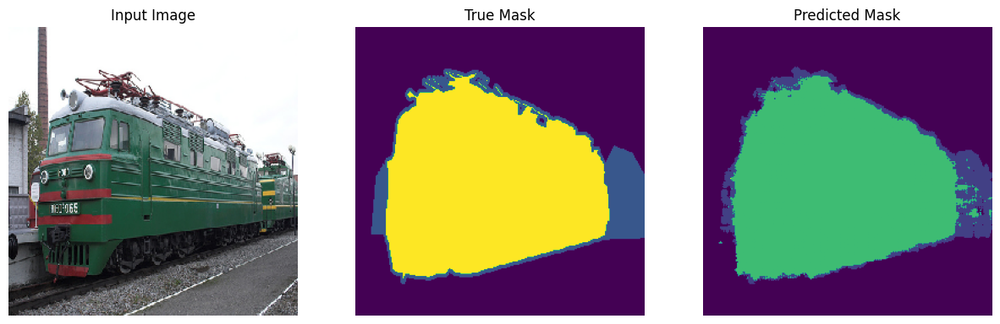

1/1 [==============================] - 1s 743ms/step


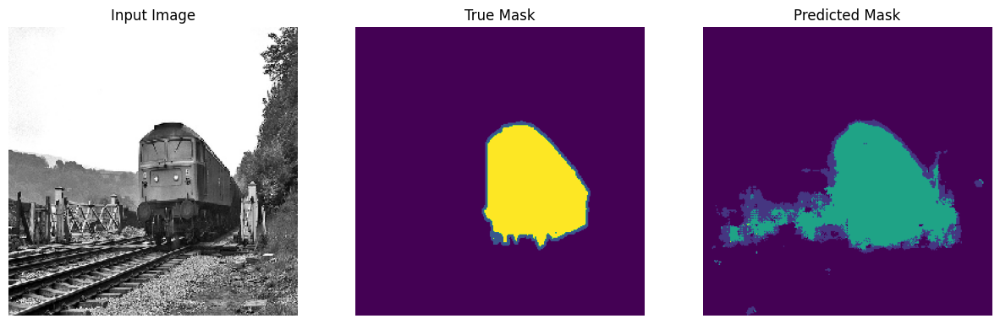

1/1 [==============================] - 0s 22ms/step


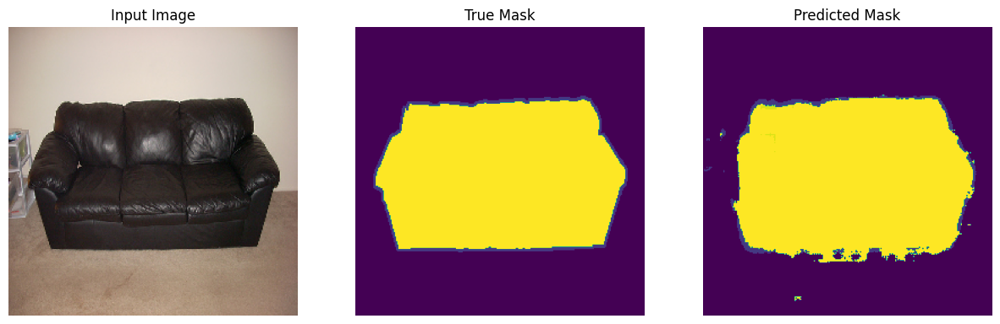

1/1 [==============================] - 0s 22ms/step


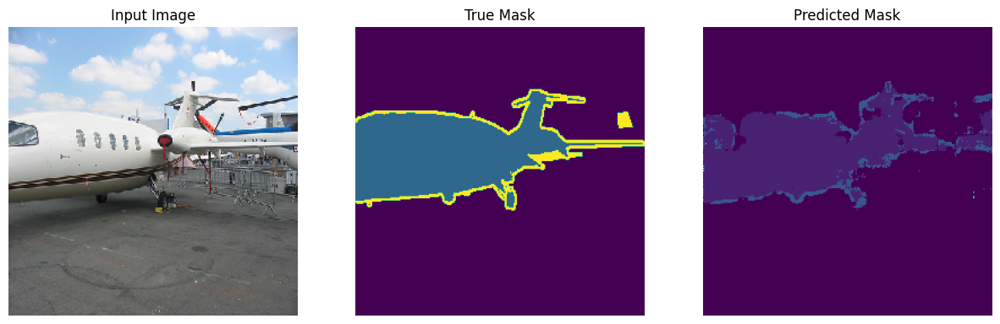

1/1 [==============================] - 0s 24ms/step


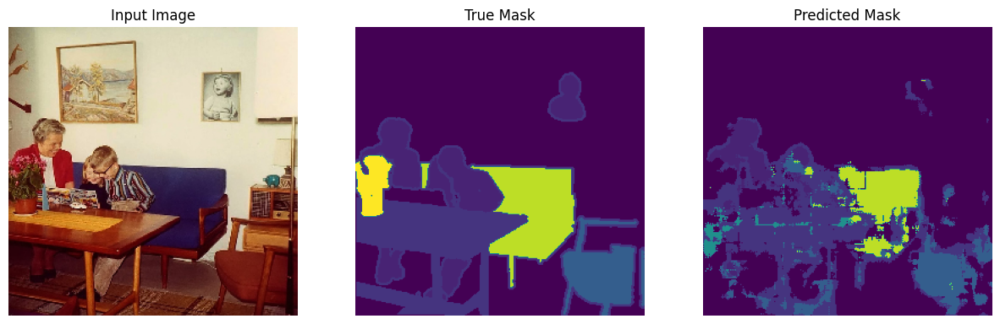

1/1 [==============================] - 0s 24ms/step


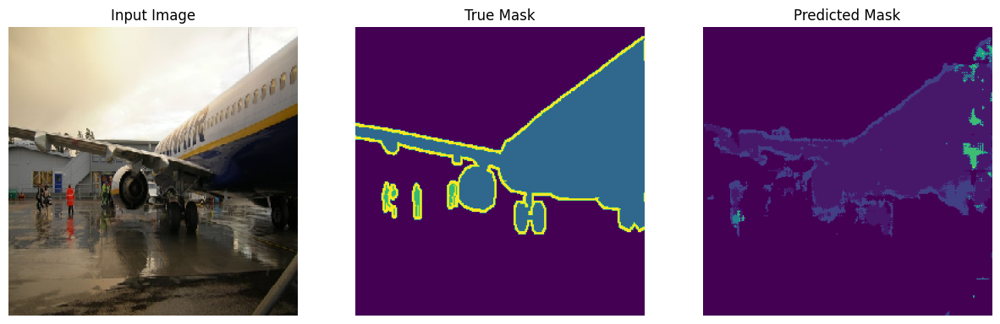

1/1 [==============================] - 0s 22ms/step


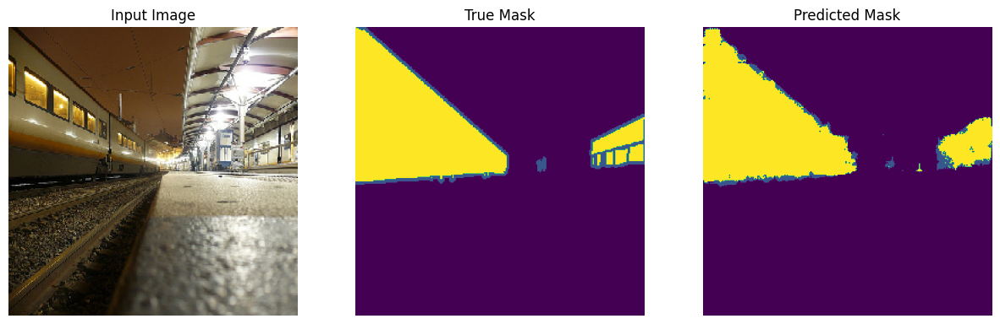

1/1 [==============================] - 0s 25ms/step


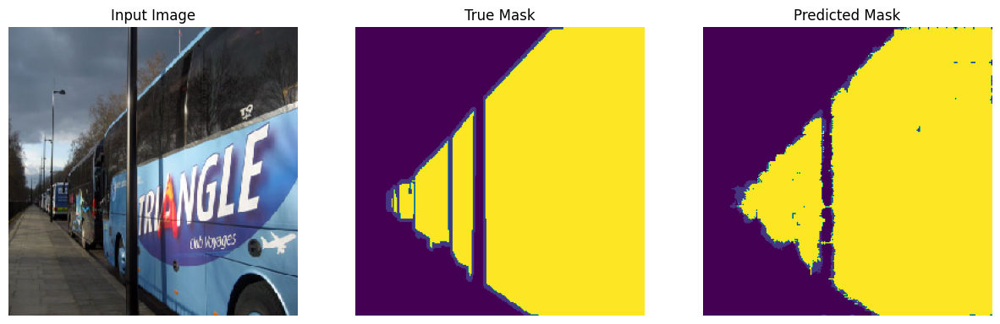

1/1 [==============================] - 0s 22ms/step


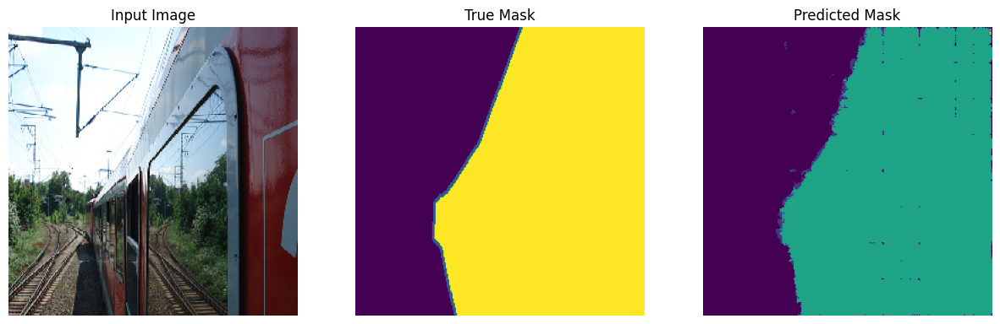

1/1 [==============================] - 0s 22ms/step


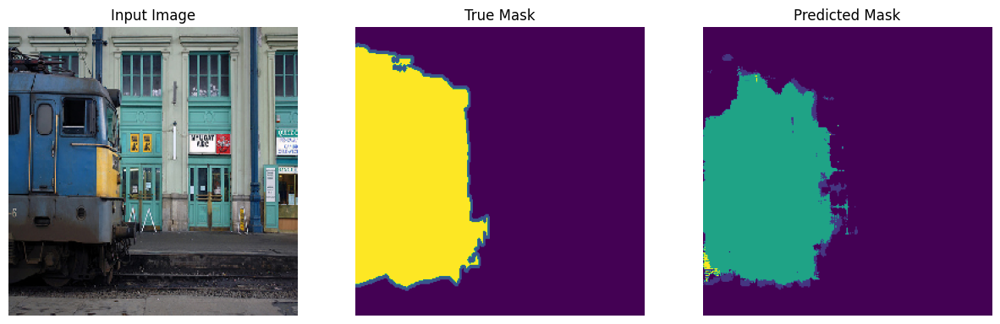

In [37]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]
def show_predictions(dataset=None, num=1):
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
    else:
        display([sample_image, sample_mask,
            create_mask(model.predict(sample_image[tf.newaxis, ...]))])
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(np.array(display_list[i]))
        plt.axis('off')
    plt.show()
show_predictions(test_dataset.shuffle(buffer_size=64), num =10)

## 평가

In [38]:
model.evaluate(test_dataset)

10/10 [==============================] - 1s 69ms/step - loss: 0.4331 - accuracy: 0.8993


[0.4330907166004181, 0.8992965221405029]

In [39]:
!mkdir source
!mkdir mask

1/1 [==============================] - 0s 23ms/step


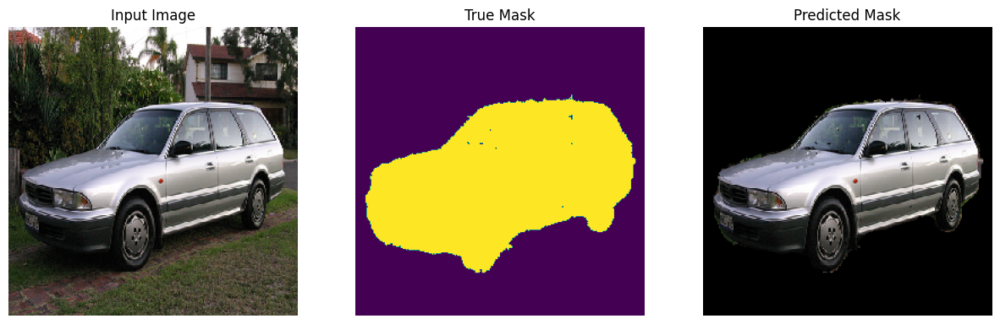

1/1 [==============================] - 0s 21ms/step


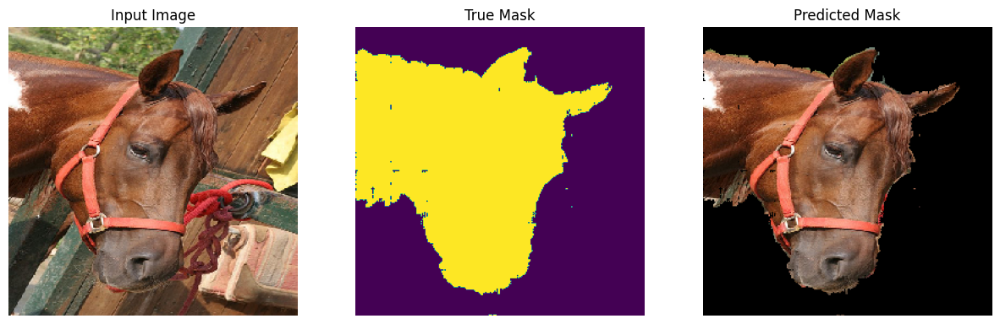

1/1 [==============================] - 0s 21ms/step


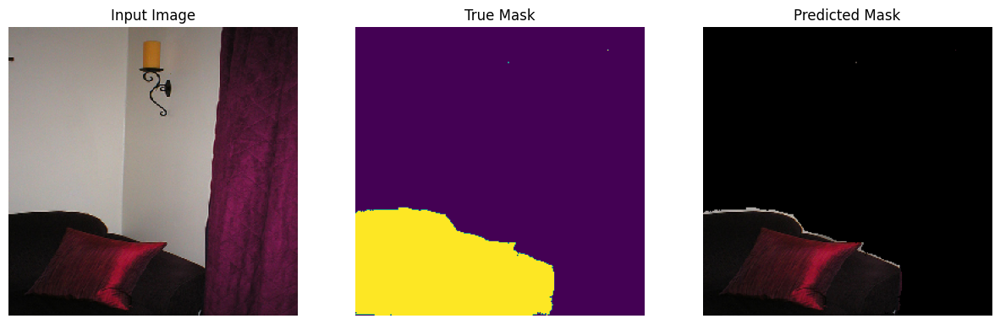

1/1 [==============================] - 0s 22ms/step


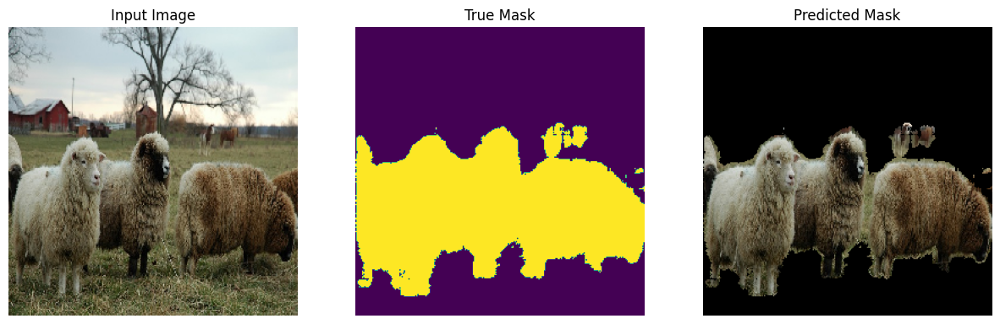

1/1 [==============================] - 0s 22ms/step


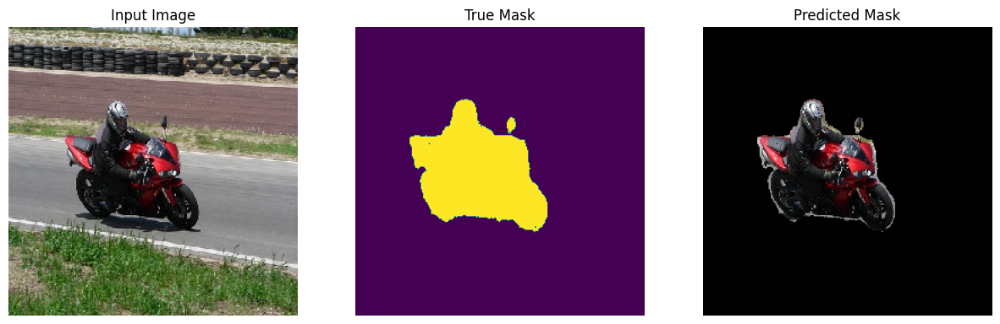

1/1 [==============================] - 0s 21ms/step


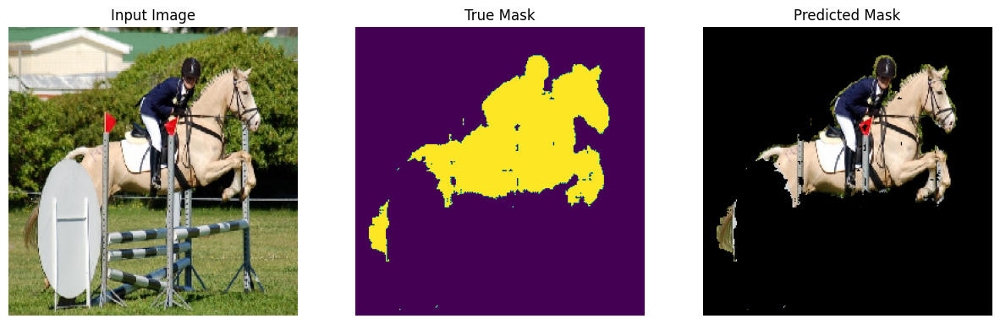

1/1 [==============================] - 0s 21ms/step


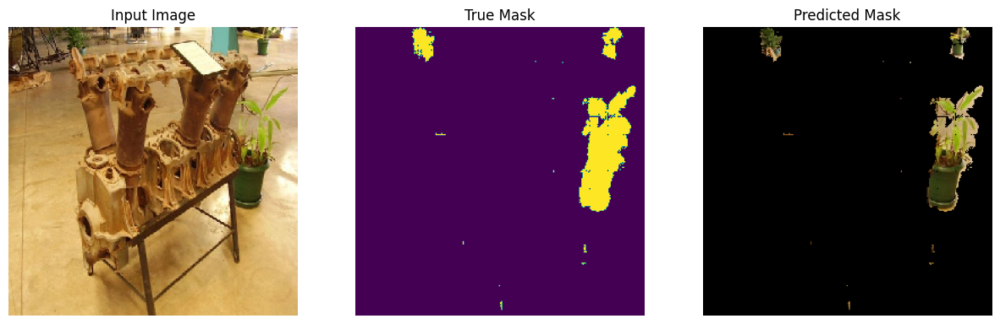

1/1 [==============================] - 0s 21ms/step


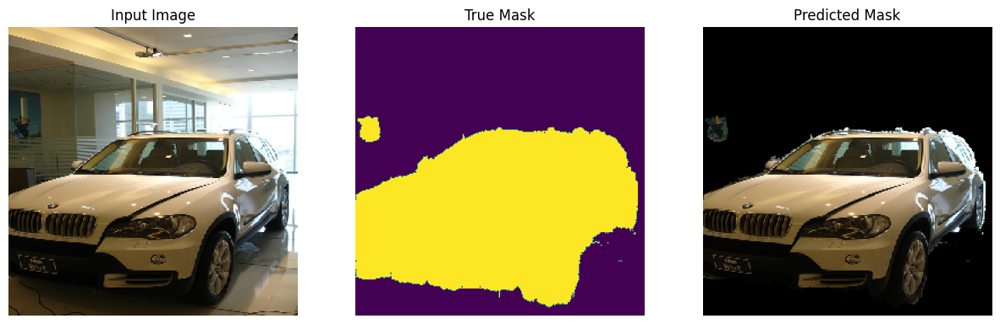

1/1 [==============================] - 0s 23ms/step


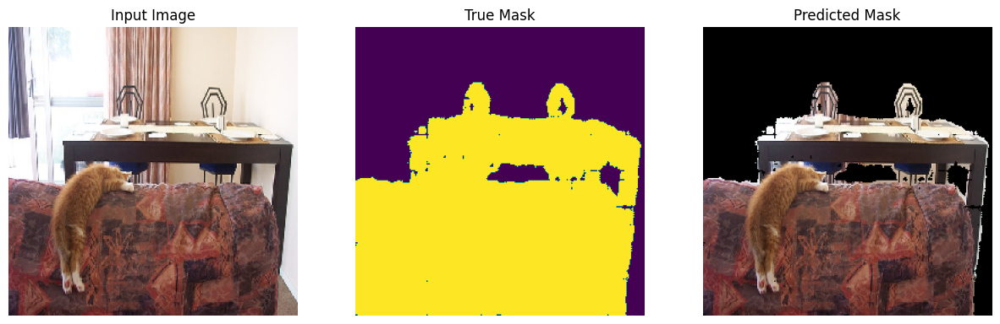

1/1 [==============================] - 0s 22ms/step


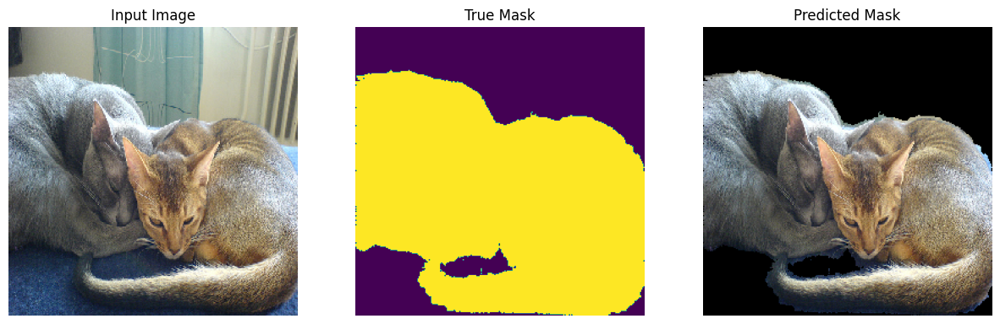

In [40]:
cnt = 0
for image, mask in train_dataset.take(10):
    pred_mask = model.predict(image)
    pred_mask = create_mask(pred_mask)
    pred_mask = (np.array(pred_mask) !=0).astype(int)
#     print(image[0].shape)
#     print(pred_mask.shape)
    Image.fromarray((np.array(image[0]*255).astype(np.uint8))).save(f"source/source_{cnt}.jpg")
    Image.fromarray((pred_mask[:,:,0]*255).astype(np.uint8)).save(f"mask/mask_{cnt}.jpg")
    display([image[0], pred_mask[:, :, 0], image[0] * pred_mask])
    cnt += 1

## Grad-CAM 시각화

In [44]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 model (Functional)          [(None, 128, 128, 96),       1841984   ['input_2[0][0]']             
                              (None, 64, 64, 144),                                                
                              (None, 32, 32, 192),                                                
                              (None, 16, 16, 576),                                                
                              (None, 8, 8, 320)]                                                  
                                                                                            

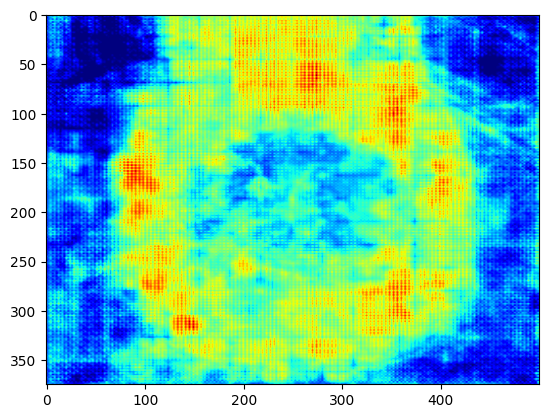

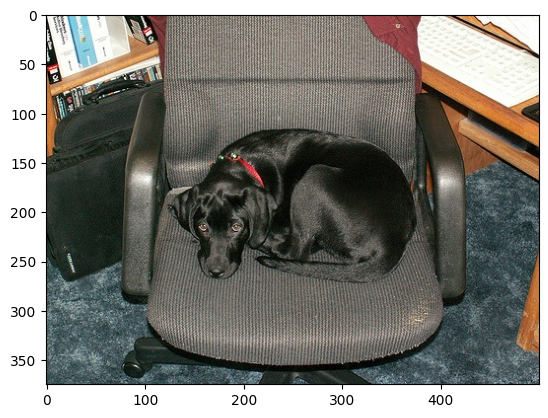

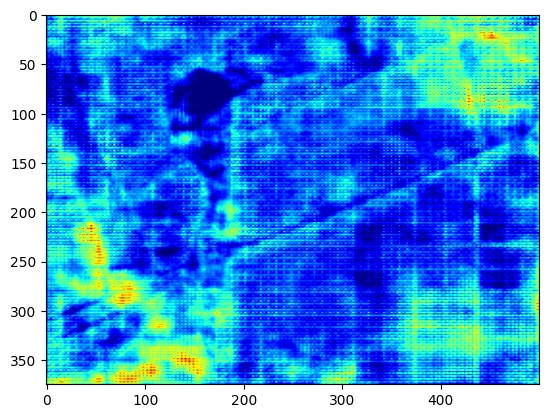

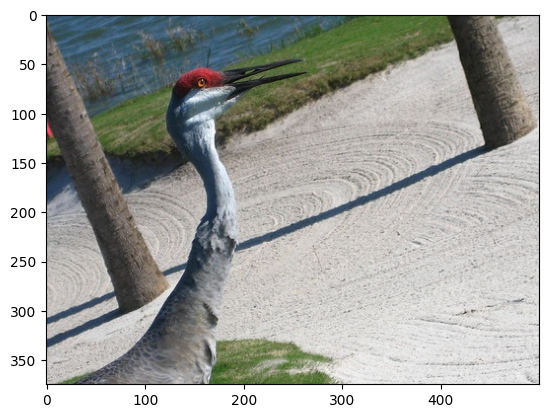

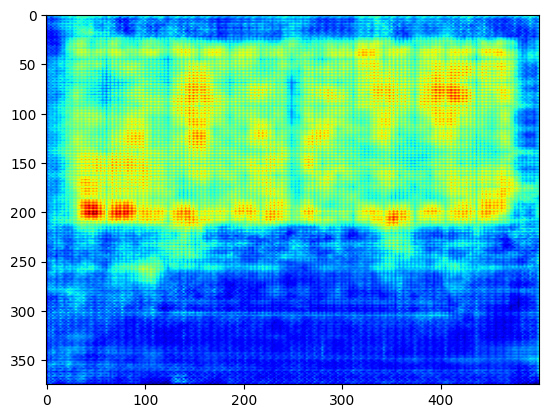

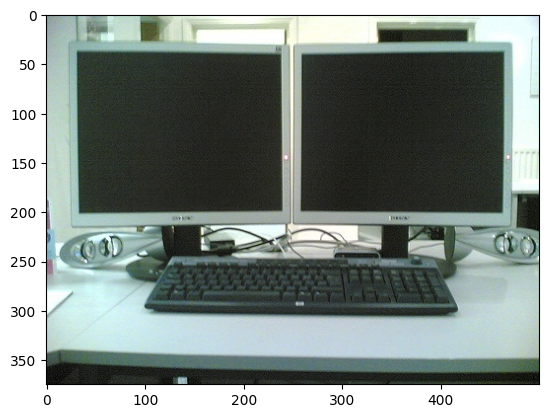

In [53]:
import cv2 
import copy
def normalize_and_resize_img(input):
    # Normalizes images: `uint8` -> `float32`
    image = np.array(input['image'])
    mask = np.array(input['mask'])
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])
    image = tf.cast(image, tf.float32) / 255.
    integer_mask= map_colors_to_labels(mask, class_color_mapping)
    integer_mask= tf.expand_dims(integer_mask, -1)
    integer_mask = tf.image.resize(integer_mask, [IMG_HEIGHT, IMG_WIDTH])
    integer_mask= tf.squeeze(integer_mask, -1)
    return image, integer_mask
def generate_grad_cam(model, activation_layer, item):
    item = copy.deepcopy(item)
    width = np.array(item['image']).shape[1]
    height = np.array(item['image']).shape[0]
    img_tensor, mask_tensor = normalize_and_resize_img(item)
    
    # Grad cam에서도 cam과 같이 특정 레이어의 output을 필요로 하므로 모델의 input과 output을 새롭게 정의합니다.
    # 이때 원하는 레이어가 다를 수 있으니 해당 레이어의 이름으로 찾은 후 output으로 추가합니다.
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(activation_layer).output, model.output])
    # Gradient를 얻기 위해 tape를 사용합니다.
    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(tf.expand_dims(img_tensor, 0))
        # 배경 클래스 제외
        non_background_predictions = predictions[:, :, :, 1:]
        # 예시 출력
        # 가정: `true_labels`는 해당 이미지의 실제 레이블을 포함하고 있음
        # `from_logits=True`는 모델 출력이 확률이 아닌 로짓임을 나타냄
        loss_function = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        mask_tensor= tf.expand_dims(mask_tensor, -1)
        mask_tensor= tf.expand_dims(mask_tensor, 0)
        loss = loss_function(mask_tensor, non_background_predictions)
        predictions = tf.squeeze(predictions, axis=0)
        predicted_classes = tf.argmax(predictions, axis=2)
        predicted_classes= tf.expand_dims(predicted_classes, -1)
        output=conv_output[0]
        grad_val = tape.gradient(loss, conv_output)[0] # 예측값에 따른 Layer의 gradient를 얻습니다.
    weights = np.mean(grad_val, axis=(0, 1)) # gradient의 GAP으로 weight를 구합니다.
    grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    for k, w in enumerate(weights):
        # output의 k번째 채널과 k번째 weight를 곱하고 누적해서 class activation map을 얻습니다.
        grad_cam_image += w * output[:, :, k]
        
    grad_cam_image = tf.math.maximum(0, grad_cam_image)
    grad_cam_image /= np.max(grad_cam_image)
    grad_cam_image = grad_cam_image.numpy()
    grad_cam_image = cv2.resize(grad_cam_image, (width, height))
    return grad_cam_image

def grad_cam_with_origin(datasets):
    grad_cam_image = generate_grad_cam(model, 'conv2d_transpose_4', datasets)
    plt.imshow(grad_cam_image, cmap='jet') 
    plt.show()
    plt.imshow(datasets["image"])
    plt.show()
for i in range(2,5):
    
    grad_cam_with_origin(dataset["train"][i])


# 회고

PASCAL VOC 2012 시멘틱 세그멘테이션과 class activation map 수행 해봤습니다.

- 데이터 EDA : 수행을 통해 데이터의 형태와 특징을 탐색을 하여 전처리 하기전에 필요한 기능들을 함수로 만들었습니다. class 와 컬러를 맵핑 하기위해 시멘틱 세그멘테이션 마스크 라벨 데이터셋에서 RGB 값을 추출하여 사전을 만들고 디코딩을 위해 역 사전을 만들었습니다.

- 데이터 전처리 : 
    - 데이터로더 객체의 비교: 데이터 전처리를 DatasetV2 와 tf.keras.utils.Sequence 를 활용하여 같은 전처리 과정을 수행을 해봤습니다. 수행 결과 tf.keras.utils.Sequence 가 훈련시 DatasetV2에 비해 더 긴 에폭시간을 가진다는 것을 알게 되었습니다. 대략 6배 정도 였습니다.
    - 전처리된 데이터의 직렬화를 통한 저장: 데이터 전처리 수행과정을 진행하며 만약 긴 실험이 될 시에 직렬화를 통한 저장이 필요한것을 느꼈다. DatasetV2의 객체를 저장하는 방법을 찾아 봤는데 TF레코드를 사용하는 방법이 있어서 적용 할려고 했지만 직렬화 함수 구현과 역직렬화 함수를 구현하는 과정이 이 과정 중에 하기는 힘든 과정이라고 생각하여 다음에 공부를 하여 적용을 시도해보기에 충분한 가치가 있다고 생각했다.
- 모델:
    - 모델 선정: 시멘틱 세그멘테이션에서 가장 높은 벤치마크 점수를 기록하고 있는 deeplabv3+와 백본으로 모바일넷과 efficentNet을 사용하는 Unet을 선정했습니다. 
- 훈련:
    - 설정: 세멘틱 세그멘테이션을 정수형 마스크로 학습을 사용하고 원핫 인코딩을 하는 것이 아니기 때문에  sparse_categorical_crossentropy를 사용 했고 logits을 손실함수에 사용 하기위해 , 손실함수의 logit 사용 옵션을 True 로 설정하고 , 모델 아웃풋의 마지막 레이어에는 활성화 함수를 적용하지 않았고 22개 (20개의 클래스와 1개의 배경 그리고 테두리 1개)의 클래스에 대해 학습을 시켜야 했기 때문에 아웃풋 채널을 22개로 설정을 했다. 
    - MLOPS: WandB 를 통해 실시간 Logger를 통해 빠른 모니터링 , 자동화된 파라미터 탐색을 수행하여 효율적인 자동화를 수행했다. 
- 평가: accuracy 를 평가지표로 삼았고 평가 그래프를 이상적으로 그렸고 샘플들을 예측한 결과를 시각화 하였을때 정상적인 세그멘테이션 작업을 수행하는 것을 확인 하였다.
- Grad-CAM: CAM을 통해 마지막 레이어의 활성도를 확인 하였습니다. 다중 분류 문제여서 인지 손실 함수로 미분을 계산하여 가중치를 채널별로 누적시켜 이미지를 처음 확인 했을때 배경에 대한 학습이 높아서 그런지 20개의 클래스에 대해서는 낮은 활성도를 보여서 배경 차원을 제외한 활성화도를 확인했고 생각했던 결과가 나온것을 알 수 있었다. CAM 을 통해 Deeplabv3+ 와 모바일넷을 백본으로 사용하는 Unet을 비교했을때 deeplabv3+ 의 아키텍쳐가 뛰어나다는 결론을 도출할수 있었다.


## tf.data.Dataset 가 빠른 이유

`tf.keras.utils.Sequence`와 `tf.data.Dataset` (여기서 `DatasetV2`로 언급된 것 같습니다)는 TensorFlow에서 데이터를 모델에 공급하는 두 가지 주요 방법입니다. 각각의 특징과 처리 방식의 차이로 인해 에폭당 처리 시간에 차이가 발생할 수 있습니다. 이 두 방법이 에폭 시간에 영향을 미치는 주요 요인을 살펴보겠습니다.

### tf.keras.utils.Sequence

1. **멀티스레딩/멀티프로세싱 지원**: `Sequence`는 멀티스레딩이나 멀티프로세싱을 사용하여 배치를 병렬로 생성할 수 있지만, 이는 설정과 환경에 따라 최적화가 필요합니다. 병렬 처리가 잘 구성되지 않으면, 데이터 로딩과 전처리에 시간이 더 걸릴 수 있습니다.

2. **온디맨드 데이터 처리**: `Sequence`는 각 배치를 요청할 때마다 데이터를 처리합니다. 데이터 전처리 과정이 복잡하거나 시간이 많이 소요되는 경우, 이는 에폭 시간을 증가시킬 수 있습니다.

3. **커스텀 데이터 처리**: `Sequence`를 사용하면 사용자 정의 데이터 로딩 및 전처리 로직을 보다 세밀하게 구현할 수 있습니다. 하지만, 이는 때때로 효율성을 저하시킬 수 있습니다.

### tf.data.Dataset

1. **고성능 파이프라인**: `Dataset` API는 최적화된 데이터 파이프라인을 구축할 수 있도록 설계되어 있습니다. 데이터 로딩, 전처리, 배치 처리 등이 매우 효율적으로 처리됩니다.

2. **캐싱 및 프리페칭**: `Dataset`은 데이터를 메모리나 디스크에 캐싱하고, 훈련 중 데이터를 미리 가져오는(프리페칭) 기능을 제공합니다. 이로 인해 I/O 대기 시간이 줄어들고 전반적인 훈련 속도가 향상됩니다.

3. **자동 최적화**: TensorFlow는 `Dataset` 파이프라인을 자동으로 최적화하여 성능을 개선할 수 있습니다. 예를 들어, `AUTOTUNE` 기능은 런타임에 데이터 로딩 및 전처리에 필요한 리소스를 동적으로 조정합니다.

### 결론

`tf.data.Dataset`이 `tf.keras.utils.Sequence`보다 훈련시 에폭당 시간이 짧은 주된 이유는 `Dataset` API의 고성능 파이프라인, 효율적인 데이터 처리, 캐싱 및 프리페칭 기능, 그리고 자동 최적화 기능 때문입니다. 반면, `Sequence`는 사용자 정의 데이터 처리가 필요한 경우에 유용하지만, 복잡한 로직이나 비효율적인 병렬 처리 구현은 성능 저하를 초래할 수 있습니다.

# 레퍼런스

[그래디언트 및 자동 미분 소개](https://www.tensorflow.org/guide/autodiff?hl=ko)

[Class Activation Maps for Semantic Segmentation](https://github.com/jacobgil/pytorch-grad-cam/blob/master/tutorials/Class%20Activation%20Maps%20for%20Semantic%20Segmentation.ipynb)

[wandb 사용법](https://github.com/wandb/wandb)

[deeplabv3+ 구조](https://www.kaggle.com/code/oluwatobiojekanmi/carla-image-semantic-segmentation-with-deeplabv3)

[시멘틱 세그멘테이션 방법](https://www.tensorflow.org/tutorials/images/segmentation?hl=ko)

[Grad-CAM keras](https://keras.io/examples/vision/grad_cam/)

[DeepLabV3+ 논문 리뷰](https://cake.tistory.com/41)